# Colon dataset

In [1]:
%load_ext autoreload

In [2]:
import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
adata = sc.read_h5ad(
    "/home/ubuntu/data/dataset-similarity/raw/f6f5913c-467b-40fe-800c-cd65375840ff_updated.h5ad",
)
adata.X = adata.X.tocsr()
adata.raw = adata.copy()

In [4]:
adata.X = sc.read_mtx("/vol/data/dataset-similarity/colon/CO_IMM.scp.matrix.mtx").X.T

In [5]:
adata.var.index = adata.var.feature_name.str.split("_").str[0]
adata = adata[:, ~adata.var.index.duplicated()]

adata.raw.var.index = adata.raw.var.feature_name.str.split("_").str[0]
adata.raw = adata.raw[:, ~adata.raw.var.index.duplicated()].to_adata()

In [6]:
x_umap = pd.read_csv(
    "/vol/data/dataset-similarity/colon/CO_IMM.scp.X_umap.coords.tsv",
    sep="\t",
    skiprows=1,
    index_col="TYPE"
)

assert adata.obs.index.equals(x_umap.index)

adata.obsm["X_umap"] = x_umap.values

## Calculate DEGs with author clustering

In [7]:
adata_macrophages = adata[
    adata.obs.Celltype.isin(
        [
            "Macrophages",
            "Macrophages LYVE1",
            "Macrophages CCL3 CCL4",
            "Macrophages Metallothionein"
        ]
    )
].copy()

In [47]:
adata_macrophages

AnnData object with n_obs × n_vars = 13843 × 28609
    obs: 'biosample_id', 'n_genes', 'n_counts', 'Type', 'donor_id', 'Layer', 'Celltype', 'organism_ontology_term_id', 'assay_ontology_term_id', 'disease_ontology_term_id', 'suspension_type', 'is_primary_data', 'cell_type_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'age group', 'sex_ontology_term_id', 'development_stage_ontology_term_id', 'tissue_type', 'tissue_ontology_term_id', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'leiden', 'leiden_R'
    var: 'feature_name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Celltype_colors', 'donor_id_colors', 'hvg', 'leiden', 'leiden_R', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [8]:
%autoreload
from datasim.de_testing.testing import calc_pseudobulk_stats
from datasim.de_testing.selection import (
    select_and_combine_de_results,
    sort_and_filter_de_genes_ova,
    sort_and_filter_de_genes_ava,
)

In [9]:
de_res_ova, de_res_ava = calc_pseudobulk_stats(
    adata_macrophages.raw.to_adata(),
    cluster_label="Celltype",
    sample_label="biosample_id"
)

R[write to console]: data.table 1.15.4 using 8 threads (see ?getDTthreads).  
R[write to console]: Latest news: r-datatable.com

Calculating AVA AUROC scores: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:14<00:00,  2.44s/it]


In [10]:
res = select_and_combine_de_results(
    sort_and_filter_de_genes_ova(
        de_res_ova,
        logfc_threshold=0.0,
        aucroc_threshold=0.5,
        adj_pval_threshold=0.05
    ),
    sort_and_filter_de_genes_ava(
        de_res_ava,
        logfc_threshold=0.0,
        aucroc_threshold=0.5,
        adj_pval_threshold=0.05
    ),
    overlap_threshold=0.3,
    n_genes_ova=None,
    n_genes_ava=None
)

In [11]:
from IPython.display import display

In [12]:
for cluster in np.unique(adata_macrophages.obs.Celltype):
    df = res[cluster]
    df = df.head(20)
    print(cluster)
    display(
        df.style
        .format("{:.2f}", subset=["logFC", "auroc"])
        .format("{:.3f}", subset=["adj.P.Val"])
    )
    print()

Macrophages


,logFC,adj.P.Val,auroc,reference
ID,,,,
PTPRCAP,0.88,0.000,0.50,['all']
HOPX,0.44,0.000,0.50,['all']
CD2,0.37,0.000,0.50,['all']
VPREB3,0.29,0.007,0.50,['all']
CD3E,0.29,0.001,0.50,['all']
MS4A1,0.28,0.005,0.50,['all']
GNLY,0.22,0.011,0.50,['all']
FAM65B,0.19,0.031,0.50,['all']
TCL1A,0.18,0.008,0.50,['all']



Macrophages CCL3 CCL4


,logFC,adj.P.Val,auroc,reference
ID,,,,
GPNMB,1.19,0.001,0.73,['all']
APOE,1.17,0.002,0.76,['all']
ADAMDEC1,1.14,0.000,0.64,['all']
FUCA1,1.04,0.002,0.73,['all']
DNASE1L3,1.03,0.002,0.73,['all']
PLA2G7,1.02,0.001,0.67,['all']
LIPA,0.99,0.002,0.73,['all']
ENPP2,0.98,0.000,0.58,['all']
GM2A,0.98,0.001,0.66,['all']



Macrophages LYVE1


,logFC,adj.P.Val,auroc,reference
ID,,,,
EGR1,1.63,0.000,0.61,['all']
CCL3,1.59,0.000,0.62,['all']
F13A1,1.46,0.000,0.62,['all']
FOSB,1.45,0.000,0.60,['all']
CCL2,1.43,0.000,0.55,['all']
IER3,1.40,0.000,0.59,['all']
HSPA1B,1.37,0.000,0.56,['all']
IL1B,1.37,0.000,0.58,['all']
CCL4,1.32,0.000,0.60,['all']



Macrophages Metallothionein


,logFC,adj.P.Val,auroc,reference
ID,,,,
MT1G,3.00,0.000,0.88,['all']
MT1H,2.79,0.000,0.77,['all']
MT1X,2.53,0.000,0.88,['all']
MT2A,2.27,0.000,0.89,['all']
MT1F,2.02,0.000,0.76,['all']
MT1E,2.00,0.000,0.77,['all']
RAB42,1.40,0.000,0.69,['all']
MT1M,1.32,0.000,0.62,['all']
GPNMB,1.30,0.000,0.74,['all']


In [13]:
markers = [
    'CCL3', 'CCL4', 'DAB2', 'A2M', 
    'LYVE1', 'F13A1', 'CCL18',
    'MT1G', 'MT1X', 'MT2A', 'MT1H', 'MT1E', 'MT1F', 'MT1M'
]


for cluster in np.unique(adata_macrophages.obs.Celltype):
    df = res[cluster]
    df.index.name = "ID"
    print(cluster)
    display(
        df
        .reset_index()
        .query(f'`ID` in {markers}')
        .style
        .format("{:.2f}", subset=["logFC", "auroc"])
        .format("{:.3f}", subset=["adj.P.Val"])
    )
    print()


Macrophages


,ID,logFC,adj.P.Val,auroc,reference



Macrophages CCL3 CCL4


,ID,logFC,adj.P.Val,auroc,reference
12,A2M,0.96,0.004,0.67,['all']
157,DAB2,0.66,0.040,0.64,['all']



Macrophages LYVE1


,ID,logFC,adj.P.Val,auroc,reference
1,CCL3,1.59,0.000,0.62,['all']
2,F13A1,1.46,0.000,0.62,['all']
8,CCL4,1.32,0.000,0.60,['all']
87,DAB2,0.73,0.029,0.54,['all']
119,LYVE1,0.61,0.000,0.55,['all']



Macrophages Metallothionein


,ID,logFC,adj.P.Val,auroc,reference
0,MT1G,3.00,0.000,0.88,['all']
1,MT1H,2.79,0.000,0.77,['all']
2,MT1X,2.53,0.000,0.88,['all']
3,MT2A,2.27,0.000,0.89,['all']
4,MT1F,2.02,0.000,0.76,['all']
5,MT1E,2.00,0.000,0.77,['all']
7,MT1M,1.32,0.000,0.62,['all']


## Plot marker gene expression with author-provided UMAPs

In [14]:
umap_x = adata_macrophages.obsm["X_umap"][:, 0]
umap_y = adata_macrophages.obsm["X_umap"][:, 1]


# remove outliers from UMAP plots
filtered_cells = (
    (umap_x < np.quantile(umap_x, 0.998)) &
    (umap_x > np.quantile(umap_x, 0.002)) &
    (umap_y < np.quantile(umap_y, 0.998)) &
    (umap_y > np.quantile(umap_y, 0.002))
)

adata_plot = adata_macrophages[filtered_cells, :].copy()

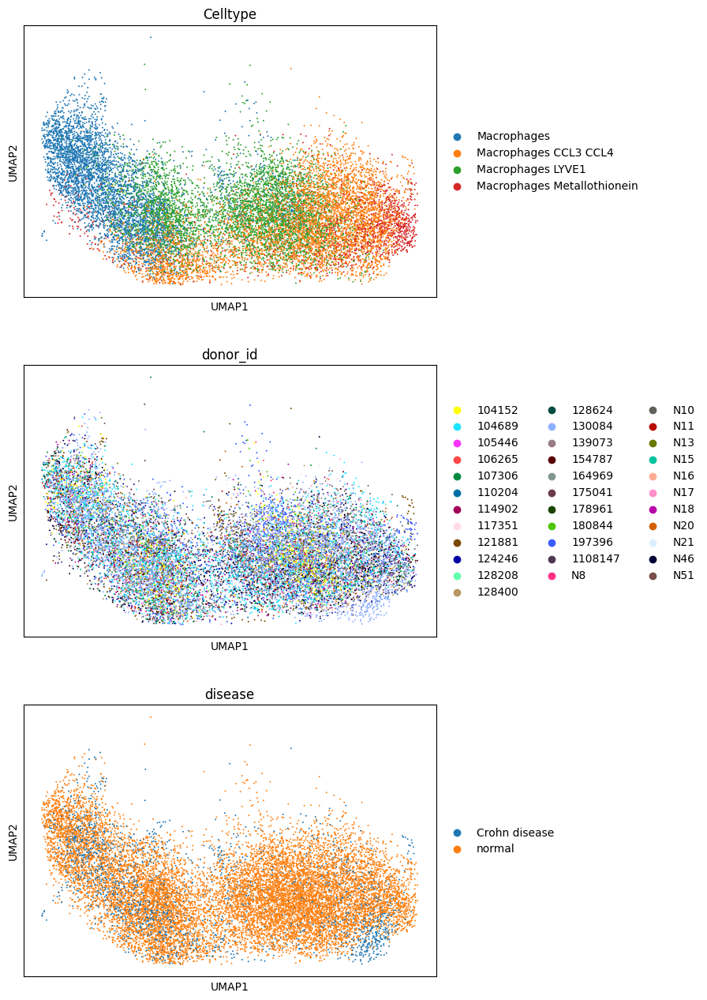

In [15]:
sc.pl.umap(adata_plot, color=["Celltype", "donor_id", "disease"], ncols=1)

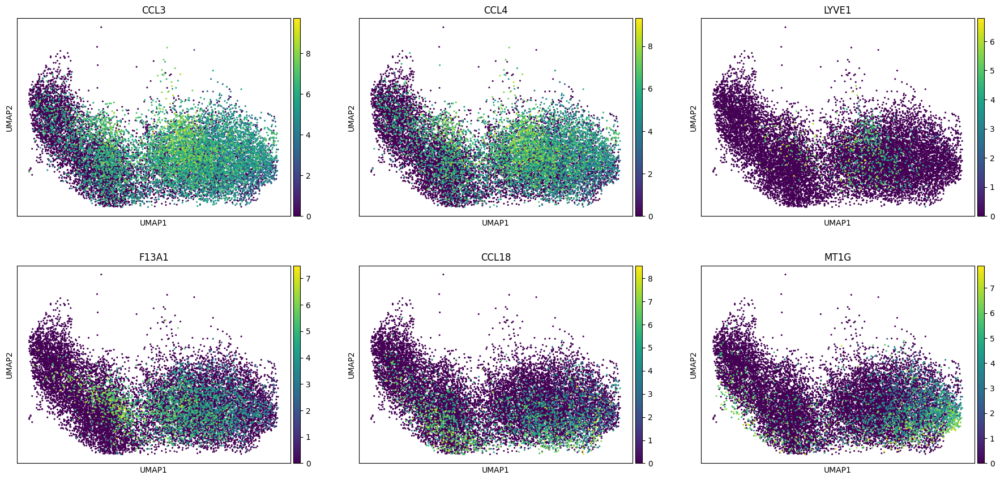

In [16]:
sc.pl.umap(adata_plot, color=["CCL3", "CCL4", "LYVE1", "F13A1", "CCL18", "MT1G"], ncols=3, use_raw=False, size=20)

## UMAP of not batch-corrected counts

In [17]:
adata_macrophages.X = adata_macrophages.raw.X.copy()
sc.pp.normalize_total(adata_macrophages, target_sum=1e4)
sc.pp.log1p(adata_macrophages)
sc.pp.highly_variable_genes(adata_macrophages)
sc.pp.pca(adata_macrophages)

In [18]:
sc.pp.neighbors(adata_macrophages)

In [19]:
sc.tl.umap(adata_macrophages)

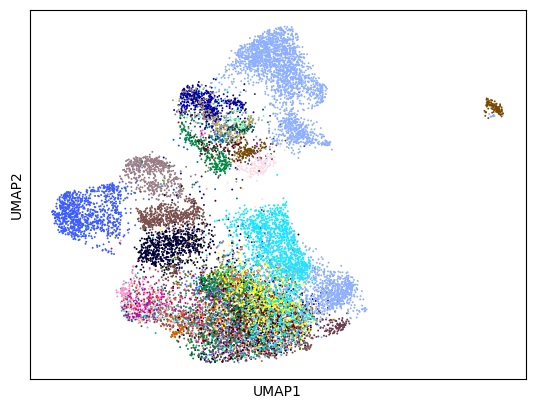

In [27]:
sc.pl.umap(adata_macrophages, color=["donor_id"], ncols=1, use_raw=False, legend_loc="none", title="", save="_colon_donor.png")

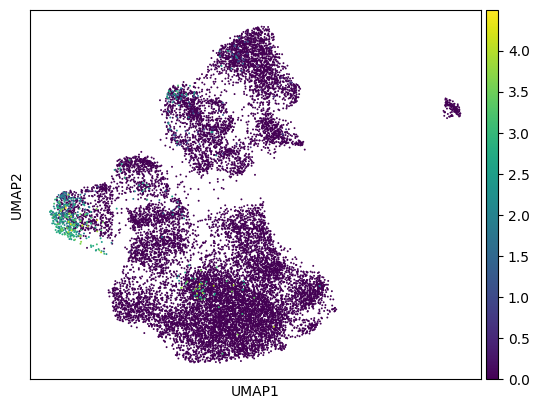

In [28]:
sc.pl.umap(adata_macrophages, color=["LYVE1"], ncols=1, use_raw=False, title="", save="_colon_LYVE1.png")

## Update clustering

In [17]:
import harmonypy

In [18]:
adata_macrophages

AnnData object with n_obs × n_vars = 15382 × 28609
    obs: 'biosample_id', 'n_genes', 'n_counts', 'Type', 'donor_id', 'Layer', 'Celltype', 'organism_ontology_term_id', 'assay_ontology_term_id', 'disease_ontology_term_id', 'suspension_type', 'is_primary_data', 'cell_type_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'age group', 'sex_ontology_term_id', 'development_stage_ontology_term_id', 'tissue_type', 'tissue_ontology_term_id', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'feature_name'
    obsm: 'X_umap'

In [19]:
adata_macrophages = adata_macrophages[
    adata_macrophages.obs.donor_id != "197396"
].copy()

In [20]:
adata_macrophages.X = adata_macrophages.raw.X.copy()
sc.pp.normalize_total(adata_macrophages, target_sum=1e4)
sc.pp.log1p(adata_macrophages)
sc.pp.highly_variable_genes(adata_macrophages)
sc.pp.pca(adata_macrophages)

In [21]:
RUN_HARMONY = True

if RUN_HARMONY:
    ho = harmonypy.run_harmony(
        adata_macrophages.obsm["X_pca"], 
        adata_macrophages.obs, 
        ["donor_id"],
        max_iter_harmony=100
    )
    adata_macrophages.obsm["X_harmony"] = ho.Z_corr.T
    sc.pp.neighbors(adata_macrophages, use_rep="X_harmony")
else:
    sc.pp.neighbors(adata_macrophages)


2025-05-02 13:08:38,237 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-05-02 13:08:43,147 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-05-02 13:08:43,190 - harmonypy - INFO - Iteration 1 of 100
2025-05-02 13:08:47,435 - harmonypy - INFO - Iteration 2 of 100
2025-05-02 13:08:51,490 - harmonypy - INFO - Iteration 3 of 100
2025-05-02 13:08:55,634 - harmonypy - INFO - Iteration 4 of 100
2025-05-02 13:08:59,772 - harmonypy - INFO - Iteration 5 of 100
2025-05-02 13:09:03,618 - harmonypy - INFO - Converged after 5 iterations


In [22]:
sc.tl.umap(adata_macrophages)

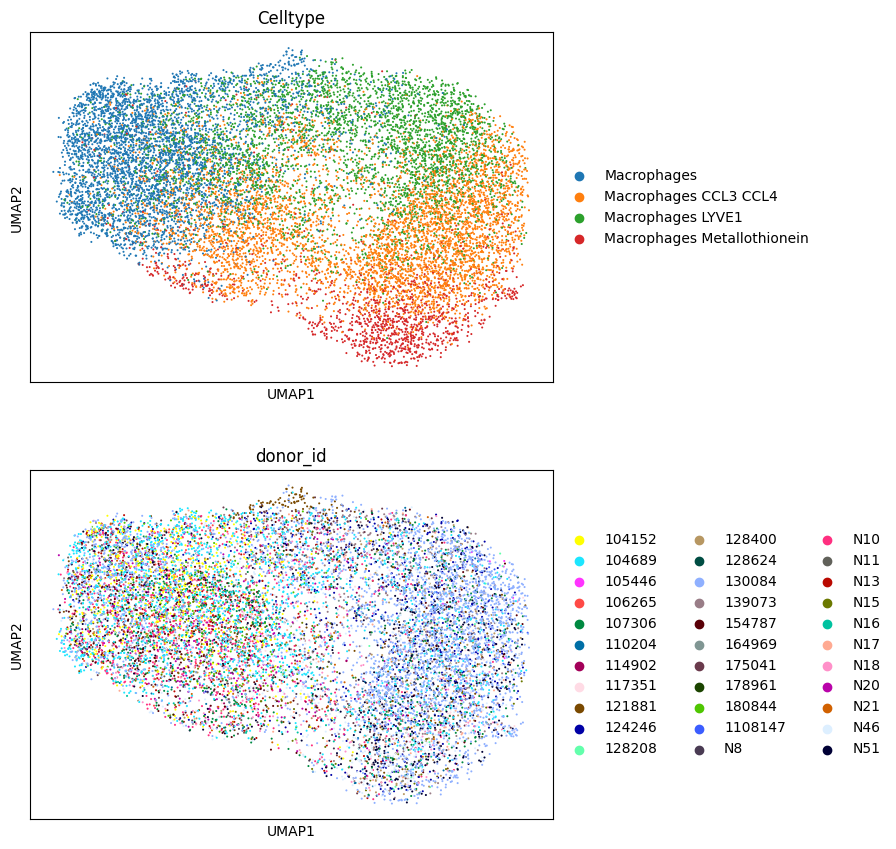

In [23]:
sc.pl.umap(adata_macrophages, color=["Celltype", "donor_id"], ncols=1)

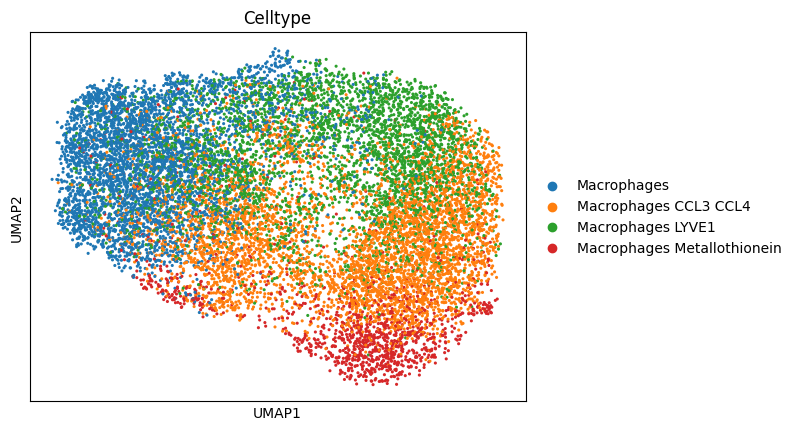

In [24]:
sc.pl.umap(adata_macrophages, color=["Celltype"], ncols=1, size=20)

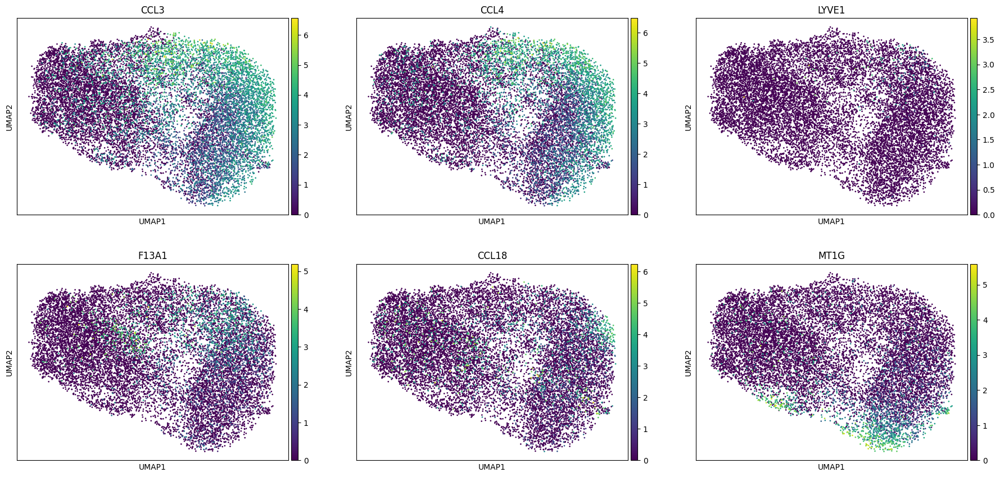

In [25]:
sc.pl.umap(
    adata_macrophages, 
    color=["CCL3", "CCL4", "LYVE1", "F13A1", "CCL18", "MT1G"], 
    ncols=3, 
    size=15, 
    use_raw=False
)

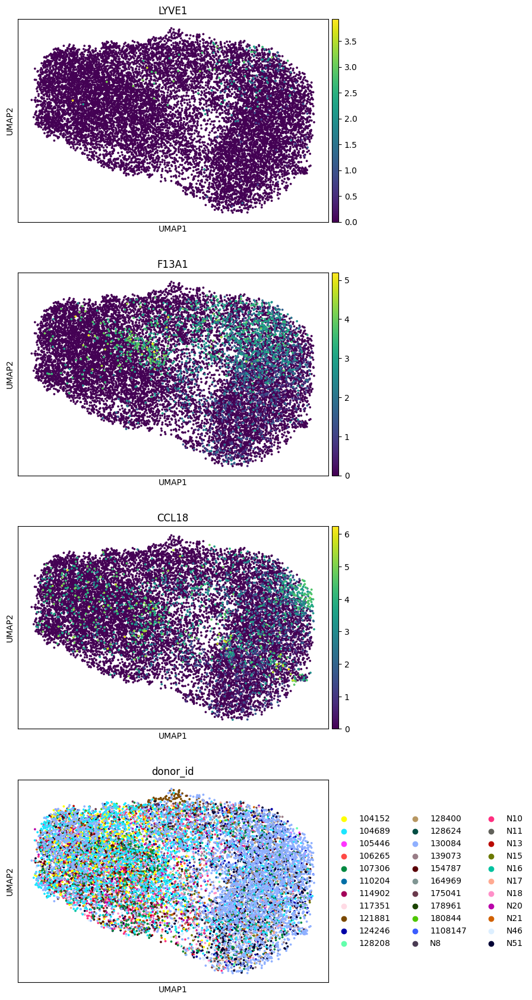

In [26]:
sc.pl.umap(
    adata_macrophages, 
    color=["LYVE1", "F13A1", "CCL18", "donor_id"], 
    ncols=1, 
    size=30, 
    use_raw=False
)

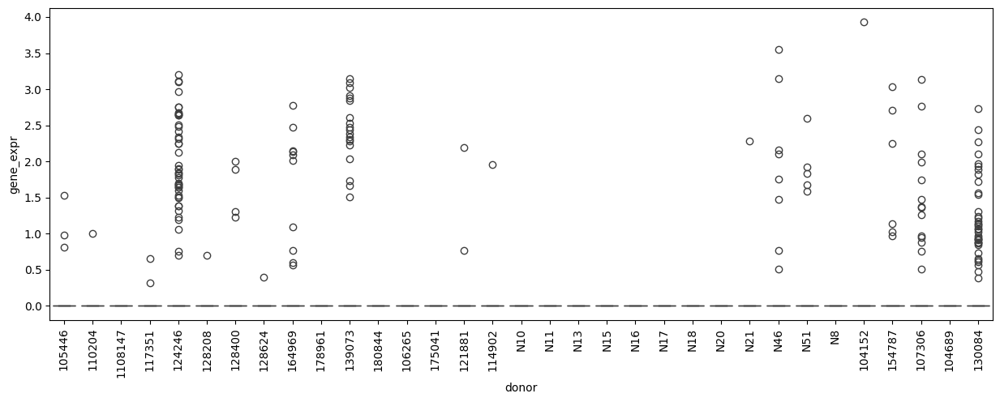

In [27]:
data = {"gene_expr": [], "donor": []}
col = "donor_id"

for donor in adata_macrophages.obs[col].unique():
    gene_expr = adata_macrophages[
        adata_macrophages.obs[col] == donor, "LYVE1"
    ].X.toarray().flatten().tolist()
    data["gene_expr"] += gene_expr
    data["donor"] += [donor] * len(gene_expr)


data = pd.DataFrame(data)

fig, ax = plt.subplots(figsize=(15, 5))
ax = sns.boxplot(
    x="donor",
    y="gene_expr",
    data=data,
)
ax.tick_params(axis='x', labelrotation=90)

In [28]:
data.groupby("donor")["gene_expr"].mean().sort_values(ascending=False).to_frame()

,gene_expr
donor,
164969,0.256269
105446,0.144960
124246,0.134203
139073,0.075530
107306,0.035891
154787,0.030523
114902,0.024734
128400,0.018987
N21,0.018591


In [29]:
sc.tl.leiden(adata_macrophages, resolution=2.)
sc.tl.leiden(adata_macrophages, restrict_to=("leiden", ["7"]), resolution=0.5)
adata_macrophages.obs["leiden"] = adata_macrophages.obs["leiden_R"]

/tmp/ipykernel_769241/1342573234.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_macrophages, resolution=2.)


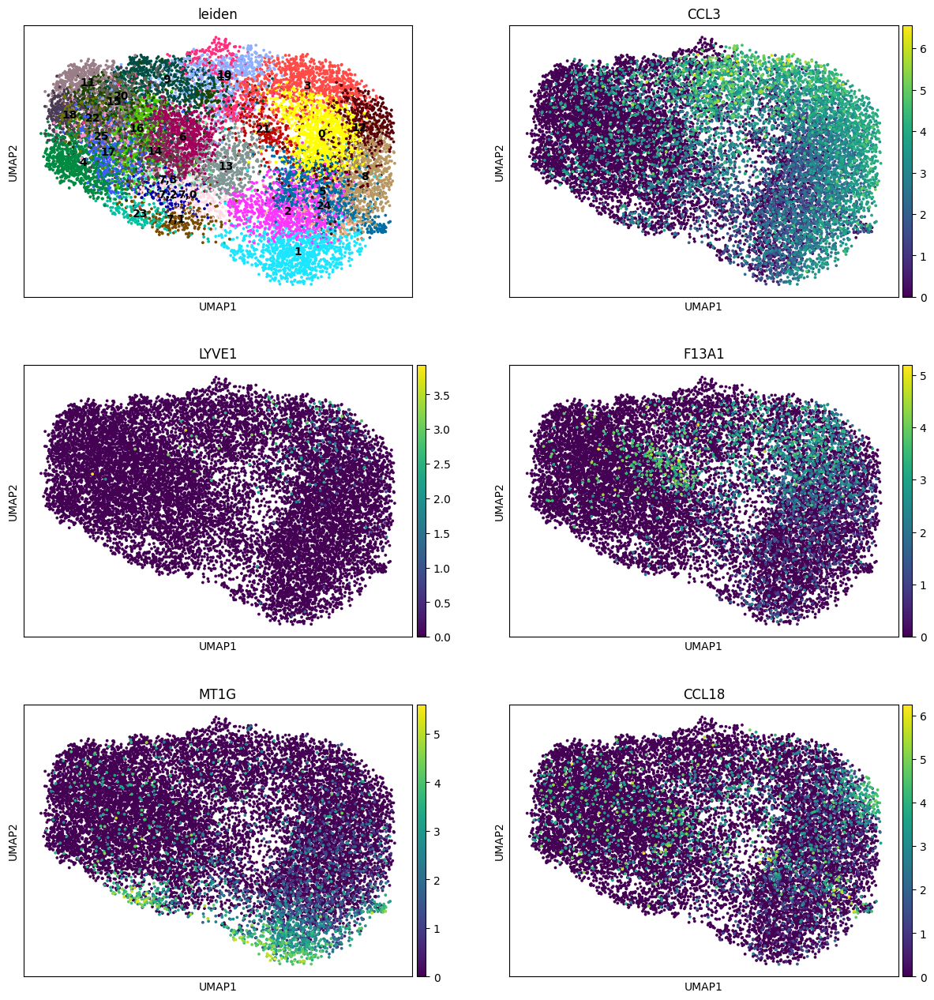

In [30]:
sc.pl.umap(adata_macrophages, color=["leiden", "CCL3", "LYVE1", "F13A1", "MT1G", "CCL18"], size=30, use_raw=False, ncols=2, legend_loc="on data")

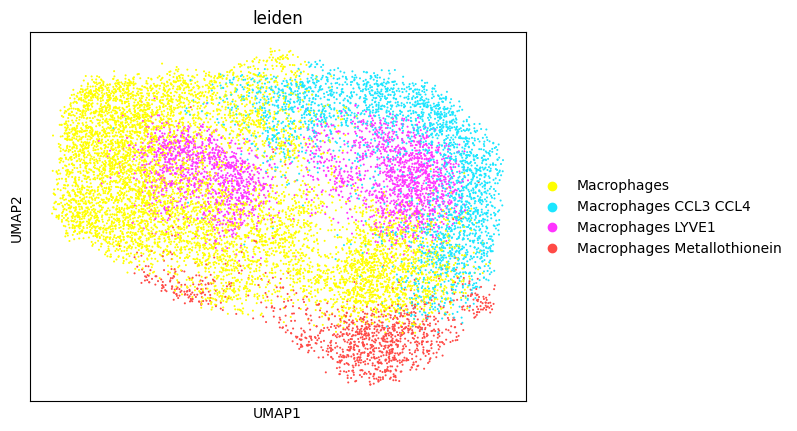

In [91]:
# combine clusters based on marker gene expression

adata_macrophages.obs["leiden"] = adata_macrophages.obs["leiden"].astype(str).replace({
    "0": "Macrophages LYVE1",
    "1": "Macrophages CCL3 CCL4",
    "2": "Macrophages Metallothionein",
    "3": "Macrophages LYVE1",
    "4": "Macrophages",
    "5": "Macrophages",
    "6": "Macrophages CCL3 CCL4",
    "7,0": "Macrophages",
    "7,1": "Macrophages",
    "7,2": "Macrophages",
    "7,3": "Macrophages Metallothionein",
    "8": "Macrophages CCL3 CCL4",
    "9": "Macrophages",
    "10": "Macrophages",
    "11": "Macrophages",
    "12": "Macrophages",
    "13": "Macrophages",
    "14": "Macrophages CCL3 CCL4",
    "15": "Macrophages",
    "16": "Macrophages",
    "17": "Macrophages",
    "18": "Macrophages",
    "19": "Macrophages LYVE1",
    "20": "Macrophages",
    "21": "Macrophages Metallothionein",
    "22": "Macrophages LYVE1",
    "23": "Macrophages",
    "24": "Macrophages",
    
})

sc.pl.umap(adata_macrophages, color="leiden")

In [92]:
%autoreload
from datasim.de_testing.testing import calc_pseudobulk_stats
from datasim.de_testing.selection import (
    select_and_combine_de_results,
    sort_and_filter_de_genes_ova,
    sort_and_filter_de_genes_ava,
)

In [93]:
de_res_ova, de_res_ava = calc_pseudobulk_stats(
    adata_macrophages.raw.to_adata(),
    cluster_label="leiden",
    sample_label="biosample_id"
)

Calculating AVA AUROC scores: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:14<00:00,  2.40s/it]


In [134]:
res = select_and_combine_de_results(
    sort_and_filter_de_genes_ova(
        de_res_ova,
        logfc_threshold=0.,
        aucroc_threshold=0.5,
        adj_pval_threshold=0.1
    ),
    sort_and_filter_de_genes_ava(
        de_res_ava,
        logfc_threshold=0.,
        aucroc_threshold=0.5,
        adj_pval_threshold=0.1
    ),
    overlap_threshold=1.,
    n_genes_ova=None,
    n_genes_ava=None
)

In [135]:
from IPython.display import display

In [136]:
for cluster in np.unique(adata_macrophages.obs.leiden):
    df = res[cluster]
    df = df.head(15)
    print(cluster)
    display(
        df.style
        .format("{:.2f}", subset=["logFC", "auroc"])
        .format("{:.3f}", subset=["adj.P.Val"])
    )
    print()

Macrophages


,logFC,adj.P.Val,auroc,reference
ID,,,,
LTB,0.77,0.002,0.50,['all']
IL32,0.76,0.007,0.50,['all']
PTPRCAP,0.68,0.001,0.50,['all']
IL22RA2,0.37,0.009,0.50,['all']



Macrophages CCL3 CCL4


,logFC,adj.P.Val,auroc,reference
ID,,,,
CCL4,2.64,0.000,0.85,['all']
CCL3,2.57,0.000,0.87,['all']
IL1B,2.52,0.000,0.82,['all']
IL8,1.92,0.000,0.73,['all']
IER3,1.79,0.000,0.77,['all']
CXCL2,1.76,0.000,0.71,['all']
NFKBIA,1.69,0.000,0.76,['all']
EGR1,1.48,0.000,0.69,['all']
CCL2,1.48,0.000,0.55,['all']



Macrophages LYVE1


,logFC,adj.P.Val,auroc,reference
ID,,,,
SLC40A1,1.37,0.000,0.67,['all']
RNASE1,1.05,0.089,0.61,['all']
F13A1,0.89,0.030,0.60,['all']
FOLR2,0.83,0.081,0.56,['all']
SEPP1,0.72,0.081,0.60,['all']
CYTH4,0.61,0.070,0.53,['all']
MTSS1,0.52,0.012,0.53,['all']
C7orf60,0.37,0.027,0.50,['all']
RASA4,0.33,0.066,0.51,['all']



Macrophages Metallothionein


,logFC,adj.P.Val,auroc,reference
ID,,,,
MT1G,3.12,0.000,0.89,['all']
MT2A,2.88,0.000,0.93,['all']
MT1H,2.68,0.000,0.75,['all']
MT1X,2.64,0.000,0.91,['all']
MT1E,1.97,0.000,0.77,['all']
MT1F,1.60,0.000,0.74,['all']
RAB42,1.30,0.000,0.69,['all']
FABP5,1.18,0.001,0.71,['all']
ATP6V0D2,1.08,0.000,0.73,['all']


In [ ]:
# markers = [
#     # 'CCL3', 'CCL4', 'DAB2', 'A2M', 
#     # 'LYVE1', 'F13A1', 'CCL18',
#     # 'MT1G', 'MT1X', 'MT2A', 'MT1H', 'MT1E', 'MT1F', 'MT1M',
# ]

markers = ["CCL3", "CCL4", "AREG", "CD83", "CXCL2", "CXCL3", "IL1B", "NAMPT", "PLAUR", "SRGN", "THBS1"]


for cluster in np.unique(adata_macrophages.obs.leiden):
    df = res[cluster]
    df.index.name = "ID"
    print(cluster)
    display(
        df
        .reset_index()
        .query(f'`ID` in {markers}')
        .style
        .format("{:.2f}", subset=["logFC", "auroc"])
        .format("{:.3f}", subset=["adj.P.Val"])
    )
    print()


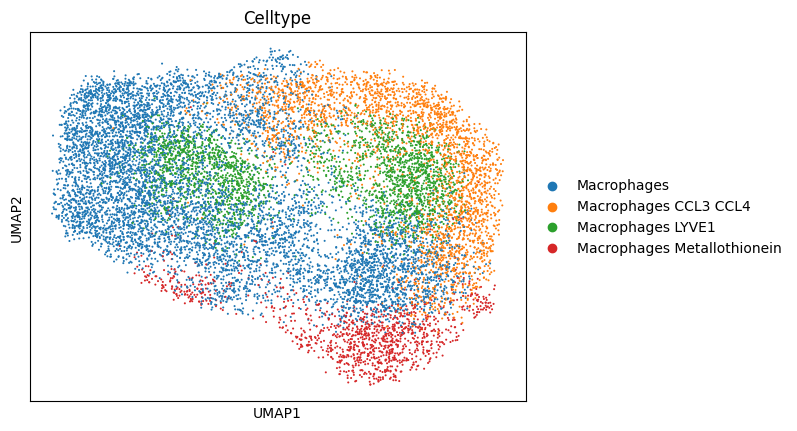

In [99]:
adata_macrophages.obs["Celltype"] = adata_macrophages.obs["leiden"]
sc.pl.umap(adata_macrophages, color="Celltype")

In [100]:
adata_macrophages.write_h5ad(
    "/vol/data/dataset-similarity/raw/Colon_macrophages_felix.h5ad",
    compression="gzip"
)

## Get differentially expressed genes for updated clustering

In [35]:
adata_macrophages = sc.read_h5ad(
    "/vol/data/dataset-similarity/raw/Colon_macrophages_felix.h5ad"
)

In [40]:
%autoreload
from datasim.de_testing.testing import calc_pseudobulk_stats
from datasim.de_testing.selection import (
    select_and_combine_de_results,
    sort_and_filter_de_genes_ova,
    sort_and_filter_de_genes_ava,
)

In [41]:
de_res_ova, de_res_ava = calc_pseudobulk_stats(
    adata_macrophages.raw.to_adata(),
    cluster_label="leiden",
    sample_label="biosample_id"
)

Calculating AVA AUROC scores: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:15<00:00,  2.54s/it]


In [42]:
res = select_and_combine_de_results(
    sort_and_filter_de_genes_ova(
        de_res_ova,
        logfc_threshold=0.,
        aucroc_threshold=0.5,
        adj_pval_threshold=0.05
    ),
    sort_and_filter_de_genes_ava(
        de_res_ava,
        logfc_threshold=0.,
        aucroc_threshold=0.5,
        adj_pval_threshold=0.05
    ),
    overlap_threshold=1.,
    n_genes_ova=None,
    n_genes_ava=None
)

In [43]:
from IPython.display import display

In [44]:
for cluster in np.unique(adata_macrophages.obs.leiden):
    df = res[cluster]
    df = df.head(15)
    print(cluster)
    display(
        df.style
        .format("{:.2f}", subset=["logFC", "auroc"])
        .format("{:.3f}", subset=["adj.P.Val"])
    )
    print()

Macrophages


,logFC,adj.P.Val,auroc,reference
ID,,,,
LTB,0.77,0.002,0.50,['all']
IL32,0.76,0.007,0.50,['all']
PTPRCAP,0.68,0.001,0.50,['all']
IL22RA2,0.37,0.009,0.50,['all']



Macrophages CCL3 CCL4


,logFC,adj.P.Val,auroc,reference
ID,,,,
CCL4,2.64,0.000,0.85,['all']
CCL3,2.57,0.000,0.87,['all']
IL1B,2.52,0.000,0.82,['all']
IL8,1.92,0.000,0.73,['all']
IER3,1.79,0.000,0.77,['all']
CXCL2,1.76,0.000,0.71,['all']
NFKBIA,1.69,0.000,0.76,['all']
EGR1,1.48,0.000,0.69,['all']
CCL2,1.48,0.000,0.55,['all']



Macrophages LYVE1


,logFC,adj.P.Val,auroc,reference
ID,,,,
SLC40A1,1.37,0.000,0.67,['all']
F13A1,0.89,0.030,0.60,['all']
MTSS1,0.52,0.012,0.53,['all']
C7orf60,0.37,0.027,0.50,['all']
LYNX1,0.09,0.025,0.50,['all']



Macrophages Metallothionein


,logFC,adj.P.Val,auroc,reference
ID,,,,
MT1G,3.12,0.000,0.89,['all']
MT2A,2.88,0.000,0.93,['all']
MT1H,2.68,0.000,0.75,['all']
MT1X,2.64,0.000,0.91,['all']
MT1E,1.97,0.000,0.77,['all']
MT1F,1.60,0.000,0.74,['all']
RAB42,1.30,0.000,0.69,['all']
FABP5,1.18,0.001,0.71,['all']
ATP6V0D2,1.08,0.000,0.73,['all']


In [45]:
# markers = [
#     # 'CCL3', 'CCL4', 'DAB2', 'A2M', 
#     # 'LYVE1', 'F13A1', 'CCL18',
#     # 'MT1G', 'MT1X', 'MT2A', 'MT1H', 'MT1E', 'MT1F', 'MT1M',
# ]

markers = ["CCL3", "CCL4", "AREG", "CD83", "CXCL2", "CXCL3", "IL1B", "NAMPT", "PLAUR", "SRGN", "THBS1"]


for cluster in np.unique(adata_macrophages.obs.leiden):
    df = res[cluster]
    df.index.name = "ID"
    print(cluster)
    display(
        df
        .reset_index()
        .query(f'`ID` in {markers}')
        .style
        .format("{:.2f}", subset=["logFC", "auroc"])
        .format("{:.3f}", subset=["adj.P.Val"])
    )
    print()

Macrophages


,ID,logFC,adj.P.Val,auroc,reference



Macrophages CCL3 CCL4


,ID,logFC,adj.P.Val,auroc,reference
0,CCL4,2.64,0.000,0.85,['all']
1,CCL3,2.57,0.000,0.87,['all']
2,IL1B,2.52,0.000,0.82,['all']
5,CXCL2,1.76,0.000,0.71,['all']
12,CXCL3,1.36,0.000,0.67,['all']
13,CD83,1.34,0.000,0.74,['all']



Macrophages LYVE1


,ID,logFC,adj.P.Val,auroc,reference



Macrophages Metallothionein


,ID,logFC,adj.P.Val,auroc,reference
